In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%reload_ext autoreload

import math
from pathlib import Path
import os
import tempfile
import shutil
from collections import defaultdict

import cv2
from matplotlib import pyplot as plt
import numpy as np


import config
from models import note_classifier, note_detector

In [3]:
os.environ["KERAS_BACKEND"] = "tensorflow"

In [4]:
def thresholding(image, th=80, imshow=False):
    img_gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    ret,thresh = cv2.threshold(img_gray,th,255,cv2.THRESH_BINARY_INV)
    if imshow: plt.imshow(thresh, cmap='gray'); plt.show()
    return thresh

In [5]:
def dilation(thresh_img, imshow=False):
    kernel = np.ones((3,85), np.uint8)
    dilated = cv2.dilate(thresh_img, kernel, iterations = 1)
    if imshow: plt.imshow(dilated, cmap='gray'); plt.show()
    return dilated

In [6]:
def find_contours(dialted_img):
    (contours, heirarchy) = cv2.findContours(dialted_img.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    sorted_contours_lines = sorted(contours, key = lambda ctr : cv2.boundingRect(ctr)[1]) # (x, y, w, h)
    return sorted_contours_lines

In [7]:
def get_line_contours(img, imshow=False):
    """Returns text lines."""
    thresh_img = thresholding(img, imshow=imshow)
    dilated_img = dilation(thresh_img, imshow=imshow)
    sorted_contours_lines = find_contours(dilated_img)

    # filter out one text lines
    if imshow: img2 = img.copy()
    for ctr in sorted_contours_lines:
        x, y, w, h = cv2.boundingRect(ctr)
        if h < 30: continue
        if imshow: cv2.rectangle(img2, (x,y), (x+w, y+h), (40, 100, 250), 2)
        yield x, y, w, h
        
    if imshow: plt.imshow(img2); plt.show()

In [8]:
# img_path = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images" / "I1PD958460320.jpg"
# img = cv2.imread(str(img_path))
# line_contours = list(get_line_contours(img, imshow=False))

In [9]:
# def get_lines(img):
#     for x, y, w, h in get_line_contours(img):
#         yield img[y:y+h, x:x+w].copy()

In [10]:
# lines = list(get_lines(img))

In [11]:
# plt.imshow(lines[3])
# plt.show()

## Create Template

In [12]:
# def create_template(image_fn, template_name, n_line, x1, x2, y1, y2):
#     img = cv2.imread(str(image_fn))
#     lines = list(get_lines(img))
#     line = lines[n_line-1]
#     plt.imshow(line)
#     plt.show()
#     template = line[y1:y2, x1:x2]

#     template_edged = cv2.Canny(template, 100, 200)
#     plt.subplot(121),plt.imshow(template,cmap = 'gray')
#     plt.subplot(122),plt.imshow(template_edged, cmap = 'gray')
#     plt.show()

#     template_fn = config.TEMPLATES_PATH / f"{template_name}.png"
#     cv2.imwrite(str(template_fn), template)

In [13]:
# image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images" / "I1PD958460320.jpg"
# create_template(image_fn, "01", 4, 705, 16)
# create_template(image_fn, "02", 7, 571, 17)
# create_template(image_fn, "03", 13, 68, 16)
# create_template(image_fn, "04", 15, 836, 16)
# create_template(image_fn, "05", 17, 461, 477, 9, 26)
# create_template(image_fn, "06", 20, 602, 17)
# create_template(image_fn, "07", 21, 763, 16)

# image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images" / "I1PD958460059.jpg"
# create_template(image_fn, "08", 7, 603, 620, 8, 25)
# create_template(image_fn, "09", 8, 470, 485, 9, 26)
# create_template(image_fn, "10", 10, 750, 765, 7, 24)
# create_template(image_fn, "11", 14, 294, 310, 9, 26)
# create_template(image_fn, "12", 16, 428, 445, 8, 25)
# create_template(image_fn, "13", 16, 662, 679, 7, 25)

# image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images" / "I1PD958460041.jpg"
# create_template(image_fn, "02_01", 2, 487, 503, 7, 25)

# image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images" / "I1PD958460043.jpg"
# create_template(image_fn, "11_01", 19, 809, 826, 17, 34)

# image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images" / "I1PD958460045.jpg"
# create_template(image_fn, "03_01", 4, 484, 500, 10, 27)
# create_template(image_fn, "13_01", 19, 679, 696, 21, 38)

# I1PD958461235.jpg - 1,2,5,12,13,14,15,16,17,18-26
# image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images" / "I1PD958461235.jpg"
#create_template(image_fn, "01_01", 2, 324, 341, 8, 25)
# create_template(image_fn, "02_02", 2, 657, 674, 8, 24)
# create_template(image_fn, "05_01", 6, 569, 586, 9, 25)
# create_template(image_fn, "12_01", 12, 393, 410, 9, 25)
# create_template(image_fn, "13_02", 12, 438, 455, 8, 25)
# create_template(image_fn, "14", 12, 566, 583, 8, 25)
# create_template(image_fn, "15", 12, 611, 628, 7, 25)
# create_template(image_fn, "16", 13, 323, 340, 8, 25)
# create_template(image_fn, "17", 13, 395, 412, 8, 24)
# create_template(image_fn, "18", 14, 852, 868, 7, 23)
# create_template(image_fn, "19", 15, 486, 501, 8, 25)
# create_template(image_fn, "20", 15, 819, 834, 8, 24)
# create_template(image_fn, "21", 17, 416, 431, 9, 24)
# create_template(image_fn, "22", 19, 87, 102, 10, 26)
# create_template(image_fn, "23", 20, 354, 369, 9, 25)
# create_template(image_fn, "24", 20, 814, 828, 8, 23)
# create_template(image_fn, "25", 21, 116, 130, 10, 27)
# create_template(image_fn, "26", 21, 672, 687, 8, 24)



# Todo
# I1PD958460507.jpg - 2
# I1PD958460513.jpg - 2,4
# I1PD958461341.jpg - 1,2,7
# I1PD958461355.jpg - 2
# I1PD958461433.jpg - 2,10
# I1PD958461369.jpg - 2
# I1PD958460856.jpp - 5

# I1PD958460117.jpg - 10
# I1PD958461022.jpg - 3

## Template Matching

In [14]:
def match_template(img, template, imshow=False, multi=False, edged=False):
    """find the given template on the image
    """
    # convert to gray scale
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
    _, w, h = template.shape[::-1]
    
    if edged:
        candi_img = cv2.Canny(img_gray, 50, 200)
        candi_template = cv2.Canny(template_gray, 50, 200)
    else:
        candi_img = img_gray
        candi_template = template_gray
        
    res = cv2.matchTemplate(candi_img, candi_template, cv2.TM_CCOEFF_NORMED)
    
    if multi:
        threshold = 0.8
        loc = np.where(res >= threshold)
        print(loc)
        matches = list(zip(*loc[::-1]))
    else:
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        matches = [max_loc]
    
    if imshow:
        _, w, h = template.shape[::-1]
        for x, y in matches:
            cv2.rectangle(img, (x, y), (x+w, y+h), 255, 2)
        plt.imshow(img)
        plt.show()

    matches = [(x, y, w, h) for x, y in matches]
    return matches

In [15]:
# image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images" / "I1PD958461235.jpg"
# template_fn = config.TEMPLATES_PATH / "01_01.png"
# match_template(cv2.imread(str(image_fn)), cv2.imread(str(template_fn)), imshow=True, multi=True)

## Find Pedurma Note Marker

In [16]:
def is_note_maker(img, match):
    x, y, w, h = match
    match_img = img[y:y+h, x:x+w]
    with tempfile.TemporaryDirectory() as tmpdir:
        match_img_fn = Path(tmpdir) / "match.jpg"
        cv2.imwrite(str(match_img_fn), match_img)
        score = note_classifier.predict(match_img_fn)
        return True if score > 0.89 else False
        

def find_pedurma_note_number(image, edged=True, imshow=False, check=True, model=True) -> list[tuple[int, int, int, int]]:
    """Find pedurma note number position in the give image.

    Returns:
        - unique_matches: list of unique matches, i.e., [(x, y, w, h), ...]
    """

    def find_unique_matches(matches):
        def are_points_close(point1, point2, tolerance):
            return math.sqrt((point2[0] - point1[0]) ** 2 + (point2[1] - point1[1]) ** 2) <= tolerance
        
        unique_matches = []
        tolerance = 10
        
        for current_point in matches:
            if not any(are_points_close(current_point, unique_point, tolerance) for unique_point in unique_matches):
                unique_matches.append(current_point)

        return unique_matches

    if isinstance(image, (Path, str)):            
        img = cv2.imread(str(image_fn))
    else:
        img = image.copy()

    if model:
        matches = note_detector.predict(image)
    else:
        matches = []
        for template_fn in sorted(config.NOTE_MAKER_TEMPLATES_PATH.iterdir()):
            if not template_fn.name.endswith(".png"): continue
            template = cv2.imread(str(template_fn))
            single_matches = match_template(img, template, edged=edged)
            matches.extend(single_matches)

    
    
    if not matches:
        return None

    unique_matches = find_unique_matches(matches)
    if check:
        final_matches = [match for match in unique_matches if is_note_maker(img, match)]
    else:
        final_matches = unique_matches
    

    if imshow:
        for x, y, w, h in final_matches:
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 1)
        plt.figure(figsize=(20, 15), dpi=100)
        plt.imshow(img)
        plt.show()
    
        
    return final_matches


image 1/1 /Users/10zinten/Developer/OpenPecha/Pedurma/images/W1PD95844/W1PD95844-I1PD95906/images/I1PD959060188.jpg: 1472x992 6 Notes, 330.4ms
Speed: 10.2ms preprocess, 330.4ms inference, 0.5ms postprocess per image at shape (1, 3, 1472, 992)
(1922, 1282)


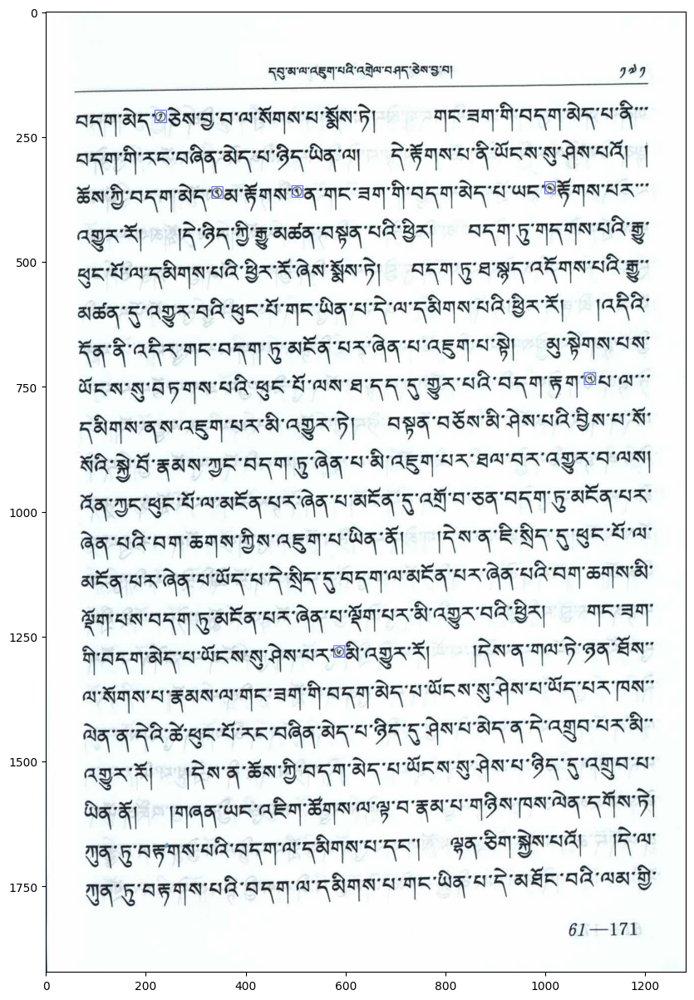

6

In [25]:
image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95906" / "images" / "I1PD959060188.jpg"
matches = find_pedurma_note_number(image_fn, edged=False, imshow=True, check=False)
len(matches)


image 1/1 /Users/10zinten/Developer/OpenPecha/Pedurma/images/W1PD95844/W1PD95844-I1PD95846/images/I1PD958461342.jpg: 1472x992 9 Notes, 358.5ms
Speed: 7.8ms preprocess, 358.5ms inference, 0.7ms postprocess per image at shape (1, 3, 1472, 992)
(1468, 964)


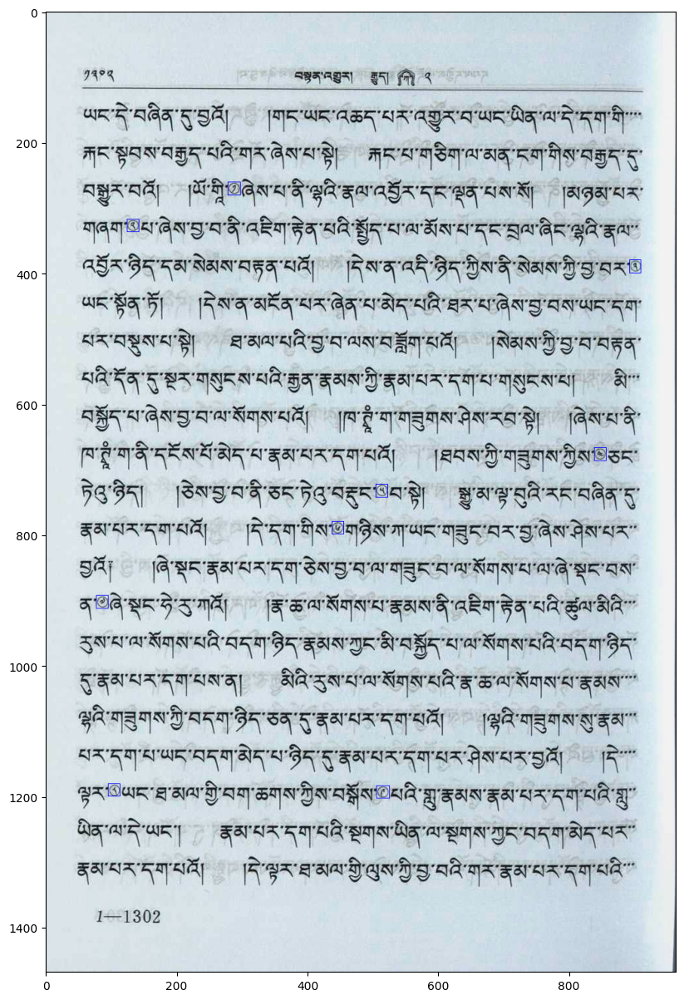

9

In [18]:
image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images" / "I1PD958461342.jpg"
matches = find_pedurma_note_number(image_fn, edged=False, imshow=True, check=False)
len(matches)

In [19]:
image_list = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95906" / "images"
image_gen = image_list.iterdir()

I1PD959060340.jpg

image 1/1 /Users/10zinten/Developer/OpenPecha/Pedurma/images/W1PD95844/W1PD95844-I1PD95906/images/I1PD959060340.jpg: 1472x1024 5 Notes, 367.3ms
Speed: 8.0ms preprocess, 367.3ms inference, 0.6ms postprocess per image at shape (1, 3, 1472, 1024)
(1922, 1312)


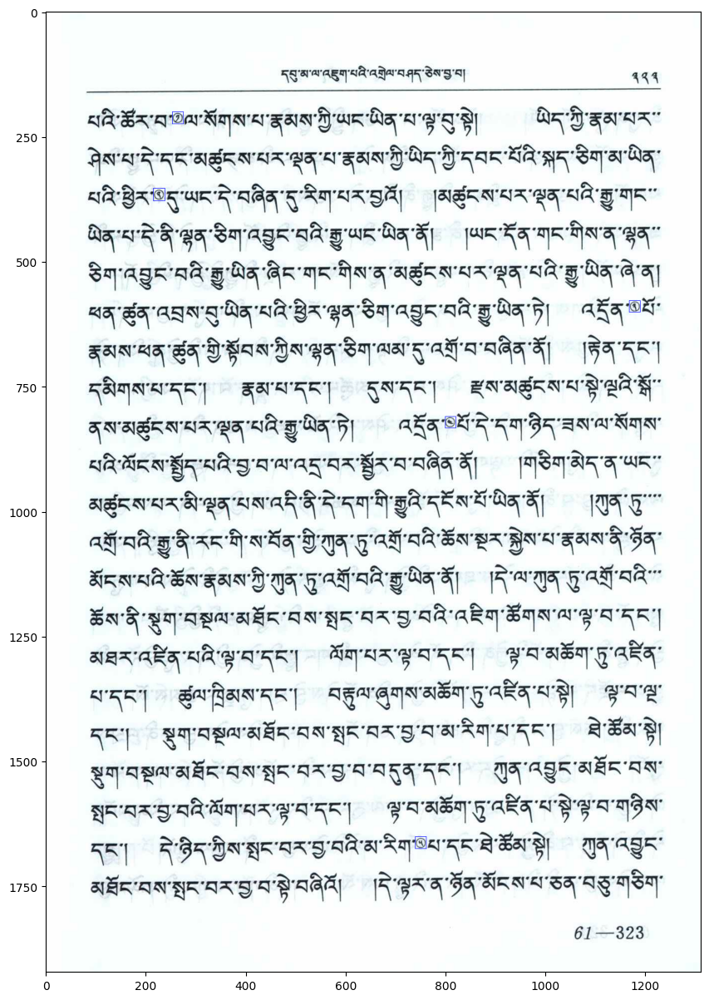

5

In [20]:
image_fn = next(image_gen)
print(image_fn.name)
matches = find_pedurma_note_number(image_fn, imshow=True)
len(matches)

In [37]:
def insert_text(image, text, position):
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1
    color = (0, 0, 0) # Blue in BGR
    thickness = 2
    line_type = cv2.LINE_AA
    cv2.putText(image, text, position, font, font_scale, color, thickness, line_type)
    return image

def remove_old_maker(image, position):
    x, y = position
    h, w = 50, 16
    patch = image[0:h, 0:w]
    image[y:y+h, x:x+w] = patch
    return image

def alter_note_maker(image_fn, insert_char=None, output_name="output"):
    image = cv2.imread(str(image_fn))
    matches = find_pedurma_note_number(image, imshow=True)
    if not matches:
        return None
    
    for x, y, w, h in matches:
        image = remove_old_maker(image, (x, y))
        if insert_char:
            insert_text(image, insert_char, (x, y+20))
            output_fn = f"{output_name}_{insert_char}.png"
        else:
            # insert black circle covering the note maker
            cv2.circle(image, (x+7, y+15), 7, (65, 66, 65), -1)
            output_fn = f"{output_name}_circle.png"

    output_path = Path("test") / output_fn
    cv2.imwrite(str(output_path), image)
    plt.imshow(image)
    plt.show()

    return image

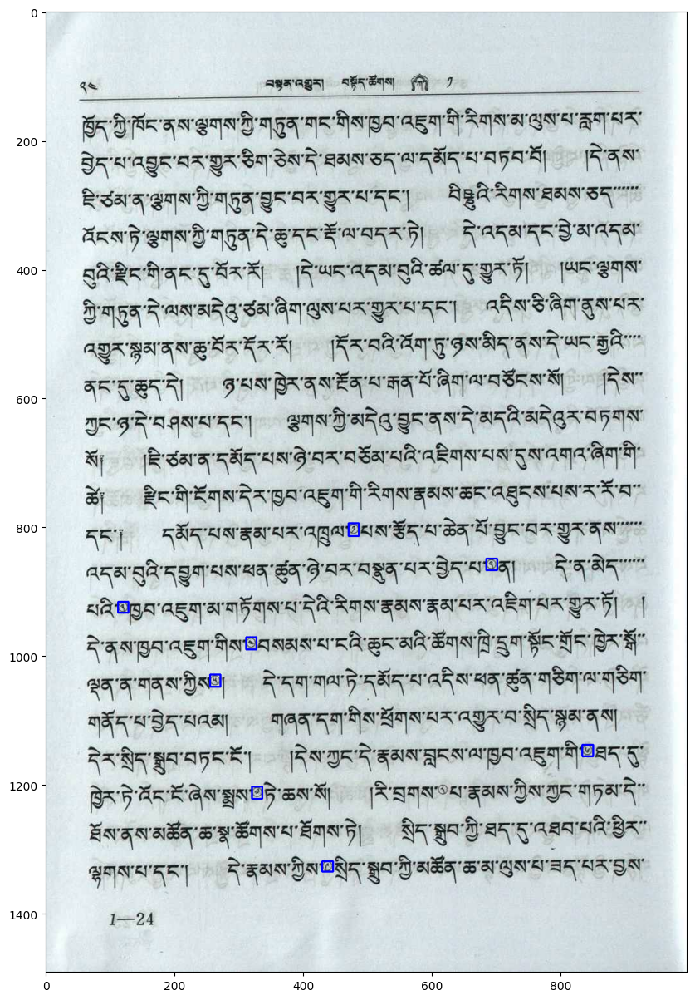

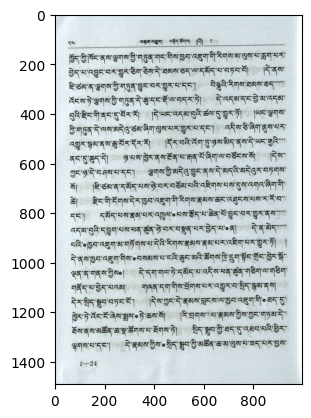

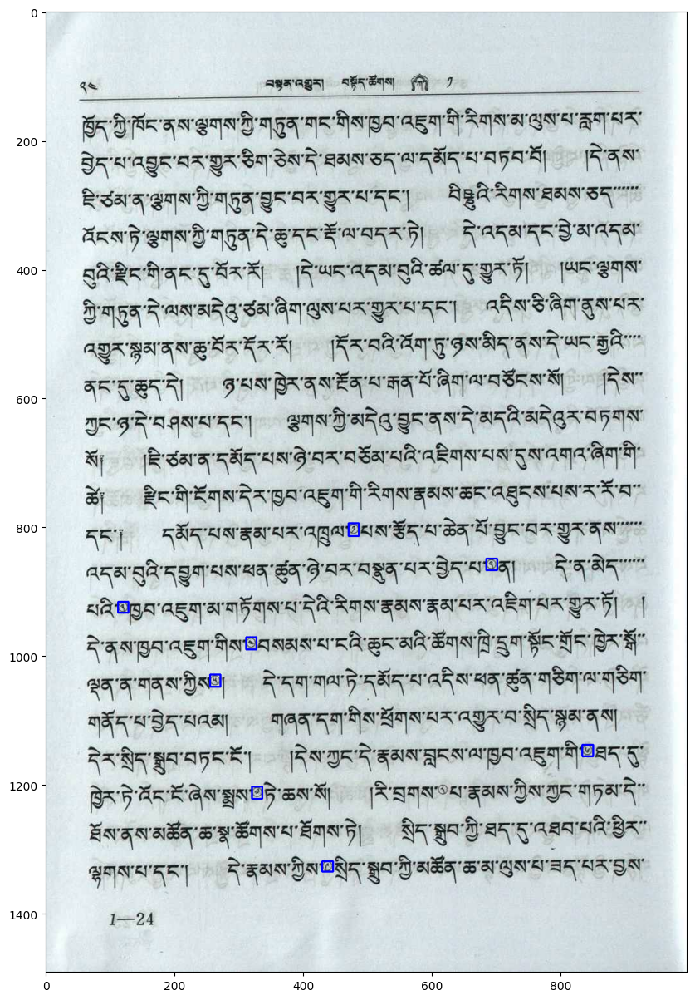

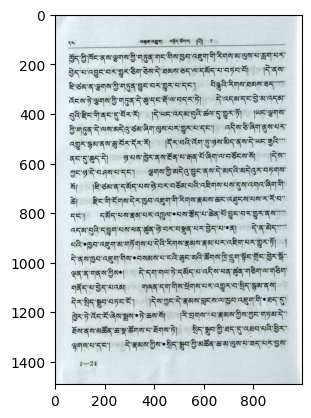

In [36]:
image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images" / "I1PD958460062.jpg"
output_name = image_fn.stem
image_new_note_maker = alter_note_maker(image_fn, "", output_name)
image_new_note_maker = alter_note_maker(image_fn, "*", output_name)

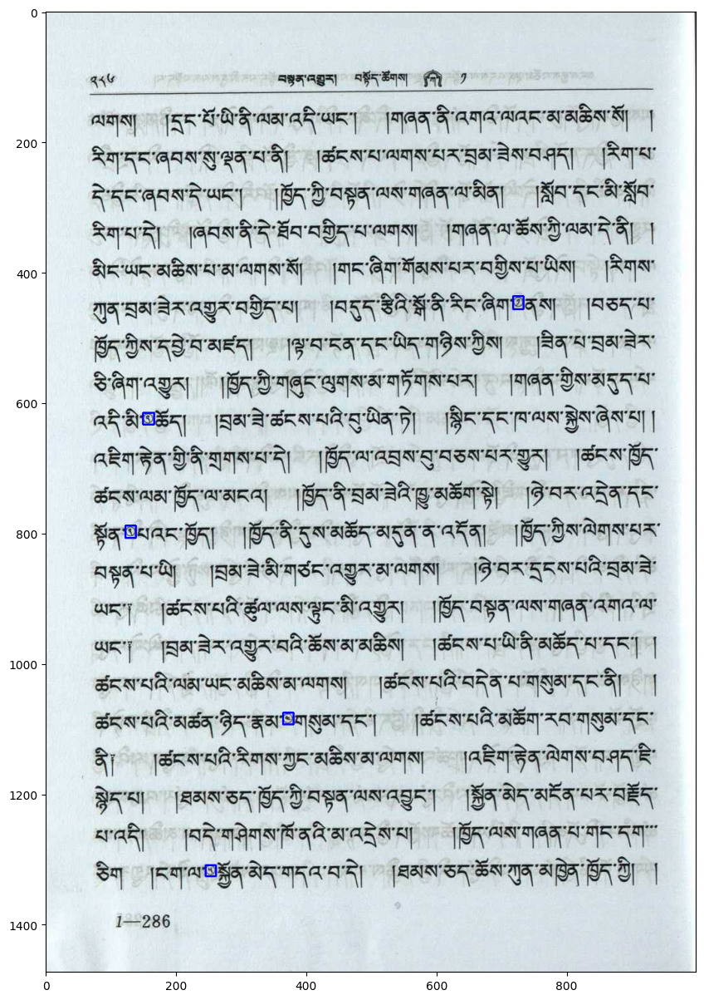

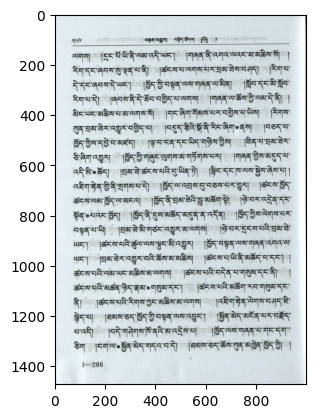

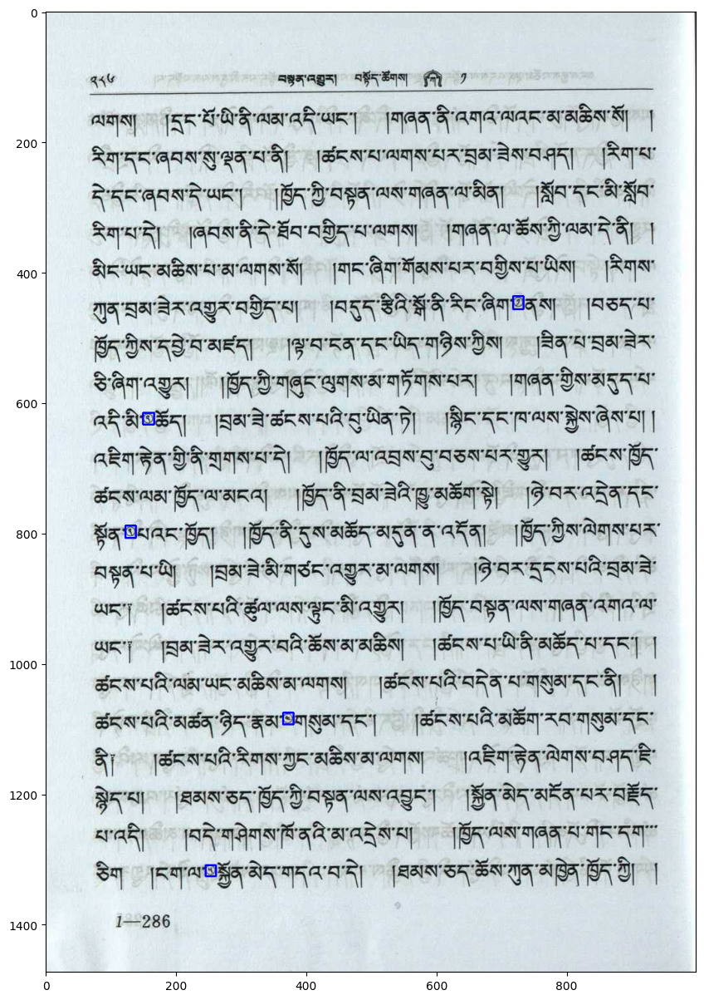

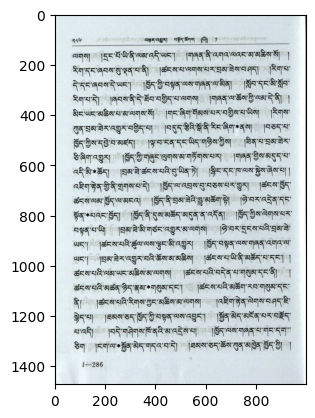

In [37]:
image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images" / "I1PD958460324.jpg"
output_name = image_fn.stem
image_new_note_maker = alter_note_maker(image_fn, "", output_name)
image_new_note_maker = alter_note_maker(image_fn, "*", output_name)

## Generate Yolo Training

In [43]:
yolo_training_data_path = config.NOTE_DETECTION_TRAINING_DATA / "data_v2"
yolo_training_data_path.mkdir(parents=True, exist_ok=True)

train_path = yolo_training_data_path /  "train"
train_images_path = train_path / "images"
train_images_path.mkdir(parents=True, exist_ok=True)
train_labels_path = train_path / "labels"
train_labels_path.mkdir(parents=True, exist_ok=True)

valid_path = yolo_training_data_path / "valid"
valid_images_path = valid_path / "images"
valid_images_path.mkdir(parents=True, exist_ok=True)
valid_labels_path = valid_path / "labels"
valid_labels_path.mkdir(parents=True, exist_ok=True)

In [52]:
def generate_yolo_training_data(images_path):
    for image_fn in images_path.iterdir():
        if not image_fn.name.endswith(".jpg"): continue
        print(f"Processing {image_fn.name} ...")
        dest_image_fn = train_path / "images" / image_fn.name
        shutil.copy(str(image_fn), str(dest_image_fn))
        label_fn =  train_path / "labels" / f"{image_fn.stem}.txt"
        if label_fn.is_file(): continue
        image = cv2.imread(str(image_fn))
        img_height, img_width, _ = image.shape
        matches = find_pedurma_note_number(image)
        if not matches: continue
        with label_fn.open("w+") as f:
            for x, y, mw, mh in matches:
                x_center = round(((2*x+mw) / 2) / img_width, 6)
                y_center = round(((2*y+mw) / 2) / img_height, 6)
                w = round(mw / img_width, 6)
                h = round(mh / img_height, 6)
                label = f"0 {x_center} {y_center} {w} {h}\n"
                f.write(label)
                print("\t-", label)

In [53]:
images_path = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images"
generate_yolo_training_data(images_path)

Processing I1PD958461180.jpg ...
Processing I1PD958461194.jpg ...

0: 1472x992 5 Notes, 337.1ms
Speed: 8.7ms preprocess, 337.1ms inference, 0.8ms postprocess per image at shape (1, 3, 1472, 992)
	- 0 0.335031 0.306604 0.016293 0.010782

	- 0 0.276986 0.770889 0.016293 0.012129

	- 0 0.437882 0.849057 0.016293 0.011456

	- 0 0.492872 0.151617 0.016293 0.011456

	- 0 0.52444 0.345687 0.016293 0.011456

Processing I1PD958461143.jpg ...

0: 1472x992 83 Notes, 339.7ms
Speed: 8.1ms preprocess, 339.7ms inference, 0.9ms postprocess per image at shape (1, 3, 1472, 992)
	- 0 0.760385 0.895889 0.017224 0.011456

	- 0 0.553191 0.898248 0.016211 0.011456

	- 0 0.321682 0.731469 0.015198 0.010782

	- 0 0.369301 0.815701 0.017224 0.011456

	- 0 0.868288 0.644205 0.016211 0.011456

	- 0 0.375887 0.619272 0.016211 0.011456

	- 0 0.151976 0.453504 0.016211 0.010782

	- 0 0.518237 0.250337 0.015198 0.011456

	- 0 0.339412 0.480458 0.016211 0.011456

	- 0 0.531915 0.309299 0.016211 0.010782

	- 0 0.542047

error: OpenCV(4.9.0) /Users/xperience/GHA-OpenCV-Python2/_work/opencv-python/opencv-python/opencv/modules/imgcodecs/src/loadsave.cpp:786: error: (-215:Assertion failed) !_img.empty() in function 'imwrite'


### Check Min length of longer size of images

In [13]:
image_sizes = []
for img_fn in images_path.iterdir():
    if not img_fn.name.endswith(".jpg"): continue
    h, w, _ = cv2.imread(str(img_fn)).shape
    image_sizes.append(h)

print(min(image_sizes))

1460


## Generate Note Classifier Training Data

In [77]:
def gen_note_classifier_training_data(images_path):
    data_save_path = config.NOTE_CLASSIFIER_TRAINING_DATA / f"todo_{images_path.parent.parent.name}"
    data_save_path.mkdir(parents=True, exist_ok=True)
    for image_fn in images_path.iterdir():
        if not image_fn.name.endswith(".jpg"): continue
        print(f"Running {image_fn.name} ...")
        image = cv2.imread(str(image_fn))
        matches = find_pedurma_note_number(image, check=False)
        if list(data_save_path.glob(f"{image_fn.stem}_*")): continue
        if not matches: continue
        for i, (x, y, w, h) in enumerate(matches):
            match = image[y:y+h, x:x+w]
            match_name = f"{image_fn.stem}_{i+1:02}.jpg"
            match_path = data_save_path / match_name
            cv2.imwrite(str(match_path), match)

In [78]:
images_path = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95906" / "images"
gen_note_classifier_training_data(images_path)

Running I1PD959060340.jpg ...

0: 1472x1024 5 Notes, 391.0ms
Speed: 9.7ms preprocess, 391.0ms inference, 0.8ms postprocess per image at shape (1, 3, 1472, 1024)
(1922, 1312)


## Generate Note Number Recognittion Dataset

In [34]:
def sort_matches(boxes):
    """
    Group bounding boxes into lines and then sort each line from left to right.

    Parameters:
    - boxes: List of tuples, where each tuple represents (x, y, w, h) of a bounding box

    Returns:
    - List of lists, where each sublist contains tuples sorted by x and grouped by line
    """
    # Sort boxes primarily by 'y' to align them into lines
    boxes.sort(key=lambda box: box[1])

    # Group boxes by lines using a vertical threshold
    lines = []
    current_line = []
    current_y = boxes[0][1]

    for box in boxes:
        # If a box's top is within the line vertical range, add it to the current line
        if abs(box[1] - current_y) < 20:  # threshold can be adjusted
            current_line.append(box)
        else:
            # Sort the current line by 'x' before adding to lines
            current_line.sort(key=lambda box: box[0])
            lines.append(current_line)
            current_line = [box]
            current_y = box[1]

    # Don't forget to add the last line
    current_line.sort(key=lambda box: box[0])
    lines.append(current_line)

    # Flatten the list of lists
    flattened_list = [box for line in lines for box in line]
    return flattened_list

In [25]:
def gen_note_num_recognition_dataset(images_path):
    data_save_path = config.NOTE_NUM_RECOGNITION_DATASET / "todo"
    data_save_path.mkdir(parents=True, exist_ok=True)
    for image_fn in images_path.iterdir():
        if not image_fn.name.endswith(".jpg"): continue
        print(f"Running {image_fn.name} ...")
        image = cv2.imread(str(image_fn))
        matches = find_pedurma_note_number(image, check=False)
        if not matches or len(matches) > 15: continue 
        sorted_matches = sort_matches(matches)
        if list(data_save_path.glob(f"{image_fn.stem}_*")): continue
        if not matches: continue
        for i, (x, y, w, h) in enumerate(sorted_matches):
            match = image[y:y+h, x:x+w]
            match_name = f"{image_fn.stem}_{i+1:02}.jpg"
            match_path = data_save_path / match_name
            cv2.imwrite(str(match_path), match)

In [ ]:
images_path = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95846" / "images"
gen_note_num_recognition_dataset(images_path)

In [37]:
def clean_step_01(images_path):
    data_save_path = config.NOTE_NUM_RECOGNITION_DATASET / "todo"
    data_save_path.mkdir(parents=True, exist_ok=True)
    counter = defaultdict(int)
    for image_fn in images_path.iterdir():
        if not image_fn.name.endswith(".jpg"): continue
        print(f"Running {image_fn.name} ...")
        note_num_list = list(data_save_path.glob(f"{image_fn.stem}_*"))
        if not note_num_list or len(note_num_list) <= 8: continue
        dest_dir = data_save_path / f"{len(note_num_list)}_{counter[len(note_num_list)]:04}"
        dest_dir.mkdir(parents=True, exist_ok=True)
        for note_num_fn in note_num_list:
            dest_note_num_fn = dest_dir / note_num_fn.name
            shutil.move(str(note_num_fn), str(dest_note_num_fn))
        counter[len(note_num_list)] += 1

In [ ]:
# images_path = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95906" / "images"
# clean_step_01(images_path)

In [ ]:
data_save_path = config.NOTE_NUM_RECOGNITION_DATASET / "todo"
for class_path in data_save_path.iterdir():
    if class_path.name.startswith(".DS_Store"): continue
    print(class_path.name)
    for note_fn in class_path.iterdir():
        if note_fn.name.startswith(".DS_Store"): continue
        h, w, _ = cv2.imread(str(note_fn)).shape
        if h > 50 or w > 50:
            print("detection error:", note_fn)
            note_fn.unlink()
            print(note_fn)


0: 1472x992 6 Notes, 335.3ms
Speed: 10.0ms preprocess, 335.3ms inference, 0.9ms postprocess per image at shape (1, 3, 1472, 992)
(1922, 1282)
1 218 197


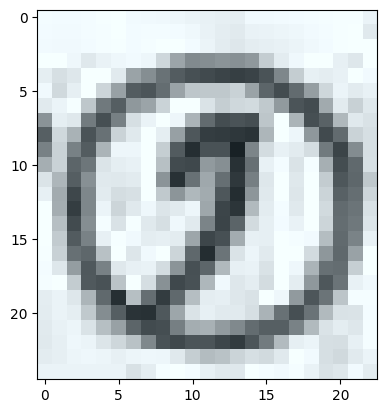

2 332 350


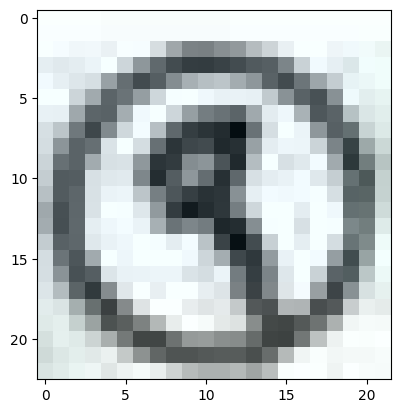

3 492 348


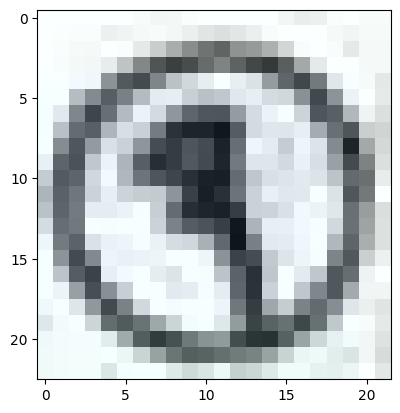

4 998 340


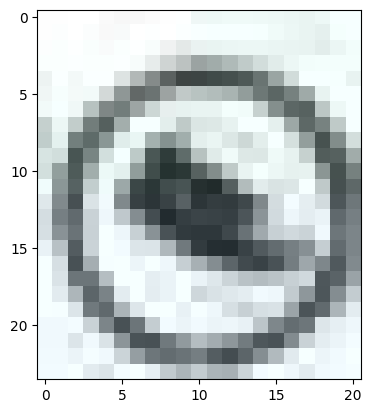

5 1077 722


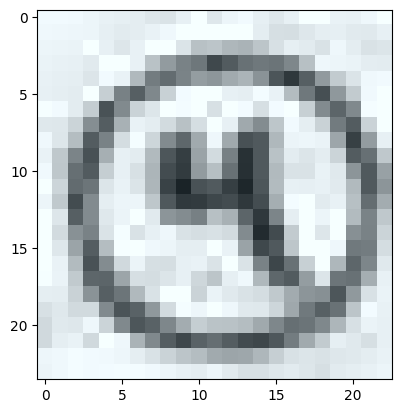

6 576 1269


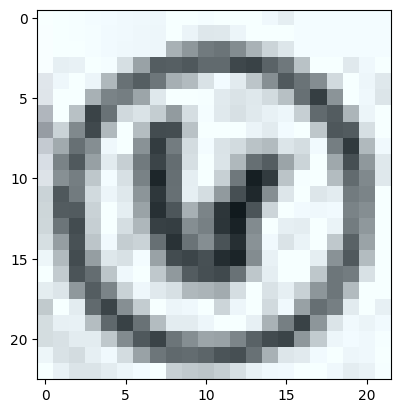

In [35]:
image_fn = config.IMAGES_PATH / "W1PD95844" / "W1PD95844-I1PD95906" / "images" / "I1PD959060188.jpg"
image = cv2.imread(str(image_fn))
matches = find_pedurma_note_number(image, check=False)
sorted_matches = sort_matches(matches)
for i, (x, y, w, h) in enumerate(sorted_matches):
    match = image[y:y+h, x:x+w]
    
    print(i+1, x, y)
    plt.imshow(match)
    plt.show()
    